In [1]:
import numpy as np
import pandas as pd

import scanpy as sc
import sklearn
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from tqdm.auto import tqdm

/data1/chenyx/anaconda3/envs/Python3.7/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from numba import set_num_threads

set_num_threads(16)

# load data

In [3]:
ad_orig = sc.read_h5ad('/data1/chenyx/sampled.raw.h5ad')

# Integration

## 3. SAUCIE

In [4]:
method = "SAUCIE"

In [5]:
import sys
sys.path.append("/data1/chenyx/SAUCIE")
import SAUCIE

/data1/chenyx/anaconda3/envs/Python3.7/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/data1/chenyx/anaconda3/envs/Python3.7/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/data1/chenyx/anaconda3/envs/Python3.7/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/data1/chenyx/anaconda3/envs/Pytho

In [6]:
adata = ad_orig.copy()

In [8]:
import scib
adata = scib.preprocessing.scale_batch(adata, "Ref")

/data1/chenyx/anaconda3/envs/Python3.7/lib/python3.7/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


### Integration

In [9]:
from sklearn.decomposition import PCA
import scipy as sp
pca_op = PCA(100)
if isinstance(adata.X, sp.sparse.csr_matrix):
    expr = adata.X.A
else:
    expr = adata.X
data = pca_op.fit_transform(expr)

In [11]:
saucie = SAUCIE.SAUCIE(data.shape[1])
loadtrain = SAUCIE.Loader(data, shuffle=True)
saucie.train(loadtrain, steps=1000)

Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


/data1/chenyx/anaconda3/envs/Python3.7/lib/python3.7/site-packages/tensorflow/python/framework/tensor_util.py:538: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


2022-05-20 19:24:55.666999: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 AVX512F FMA
2022-05-20 19:24:55.716511: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2200000000 Hz
2022-05-20 19:24:55.725325: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x5653c2444210 executing computations on platform Host. Devices:
2022-05-20 19:24:55.725358: I tensorflow/compiler/xla/service/service.cc:175]   StreamExecutor device (0): <undefined>, <undefined>
2022-05-20 19:24:55.871153: W tensorflow/compiler/jit/mark_for_compilation_pass.cc:1412] (One-time warning): Not using XLA:CPU for cluster because envvar TF_XLA_FLAGS=--tf_xla_cpu_global_jit was not set.  If you want XLA:CPU, either set that envvar, or use experimental_jit_scope to enable XLA:CPU.  To confirm that XLA is active, pass --vmodule=xla_compilation_cache=1 (as a proper command-line flag, not via TF_XLA

In [12]:
loadeval = SAUCIE.Loader(data, shuffle=False)
embedding = saucie.get_embedding(loadeval)
number_of_clusters, clusters = saucie.get_clusters(loadeval)
reconstruction = saucie.get_reconstruction(loadeval)

---- Num clusters: 18 ---- Percent clustered: 0.025 ----


In [14]:
adata.obsm['X_pca'] = reconstruction
adata.X = pca_op.inverse_transform(adata.obsm["X_pca"])

## visualization

In [15]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

In [16]:
sc.tl.umap(adata)

### save fig

/data1/chenyx/anaconda3/envs/Python3.7/lib/python3.7/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


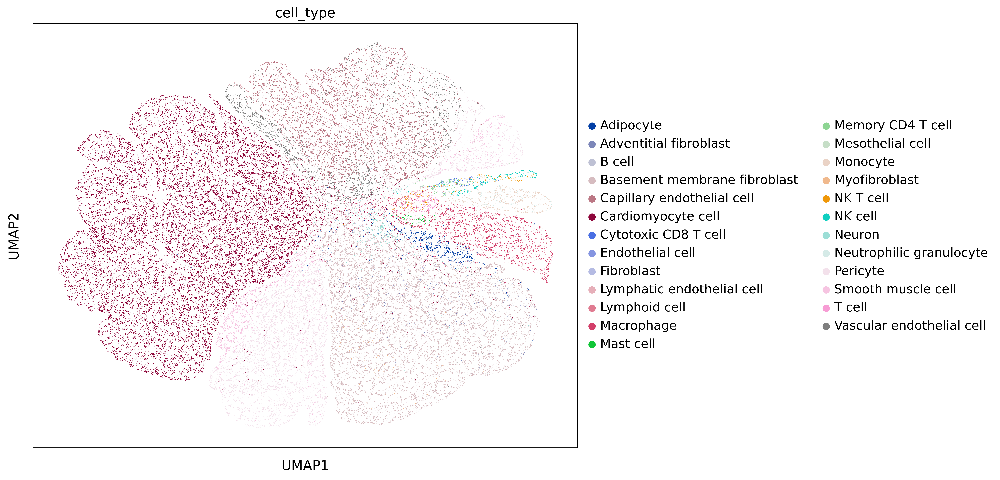

In [17]:
sc.set_figure_params(dpi=300)
fig = sc.pl.embedding(adata, basis="umap", color="cell_type", return_fig=True)
fig.set_size_inches(10, 8)
fig.savefig(method + ".celltype.png", bbox_inches='tight')

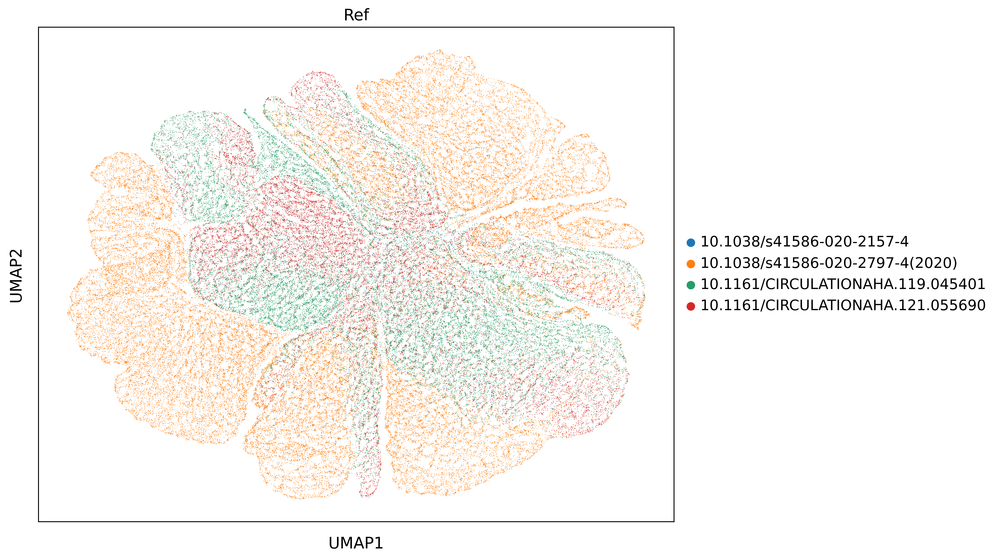

In [18]:
fig = sc.pl.embedding(adata, basis="umap", color="Ref", return_fig=True)
fig.set_size_inches(10, 8)
fig.savefig(method + ".batch.png", bbox_inches='tight')

### save coordinates and adata

In [19]:
label = "UMAP"
basis = "umap"
print('Saving embedding coordinates...')
adata.obs[label + '1'] = adata.obsm['X_' + basis][:, 0]
adata.obs[label + '2'] = adata.obsm['X_' + basis][:, 1]
coords = adata.obs[["cell_type", "donor_ID", label + '1', label + '2']]
coords.to_csv(method + ".UMAP.csv", index_label='CellID')

Saving embedding coordinates...


In [20]:
adata.write('/data1/chenyx/processed.saucie.h5ad')
del adata